# Importing dataset

In [1]:
import pandas as pd
Train=pd.read_excel("train.xlsx",sheet_name='train')

In [2]:
Train

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


# Importing Datatype of each feature

In [3]:
Dt=pd.read_excel("train.xlsx",sheet_name='datatypes')

In [4]:
Dt

,Features,Datatype,Unnamed: 2
0,Id,Continuous,NaN
1,MSSubClass,Categorical,NaN
2,MSZoning,Categorical,NaN
3,LotFrontage,Continuous,NaN
4,LotArea,Continuous,NaN
...,...,...,...
76,MoSold,Categorical,doubt
77,YrSold,Categorical,doubt
78,SaleType,Categorical,NaN
79,SaleCondition,Categorical,NaN


# Continuous data types

In [5]:
Dt_con= Dt[Dt['Datatype'] == 'Continuous']

In [6]:
continous_col=Dt_con['Features'].to_list()
continous_header = ['Count', '% Miss', 'Card.', 'Min.', '1st Qrt.', 'Mean', 'Median', '3rd Qrt.', 'Max.', 'Std. Dev.']

In [7]:
continous_df=pd.DataFrame(index=continous_col, columns=continous_header)
continous_df.index.name = 'FEATURENAME'
columns = Train[continous_col]

In [8]:
#Count
continous_df[continous_header[0]] = columns.count()

#Percentage of values missing
missing = columns.isna()
continous_df[continous_header[1]] = missing.sum() / len(columns)

#Cardinality
continous_df[continous_header[2]] = columns.nunique()

#Min
continous_df[continous_header[3]] = columns.min()

#First quartile
continous_df[continous_header[4]] = columns.quantile(0.25)

#Mean 
continous_df[continous_header[5]] = round(columns.mean(), 1)

#Median
continous_df[continous_header[6]] = columns.median()

#Third quartile
continous_df[continous_header[7]] = columns.quantile(0.75)

#Max
continous_df[continous_header[8]] = columns.max()


#Standard deviation
continous_df[continous_header[9]] = round(columns.std(), 1)

In [9]:
continous_df # Data quality report for continous

,Count,% Miss,Card.,Min.,1st Qrt.,Mean,Median,3rd Qrt.,Max.,Std. Dev.
FEATURENAME,,,,,,,,,,
Id,1460,0.000000,1460,1.0,365.75,730.5,730.5,1095.25,1460.0,421.6
LotFrontage,1201,0.177397,110,21.0,59.00,70.0,69.0,80.00,313.0,24.3
LotArea,1460,0.000000,1073,1300.0,7553.50,10516.8,9478.5,11601.50,215245.0,9981.3
MasVnrArea,1452,0.005479,327,0.0,0.00,103.7,0.0,166.00,1600.0,181.1
BsmtFinSF1,1460,0.000000,637,0.0,0.00,443.6,383.5,712.25,5644.0,456.1
BsmtFinSF2,1460,0.000000,144,0.0,0.00,46.5,0.0,0.00,1474.0,161.3
BsmtUnfSF,1460,0.000000,780,0.0,223.00,567.2,477.5,808.00,2336.0,441.9
TotalBsmtSF,1460,0.000000,721,0.0,795.75,1057.4,991.5,1298.25,6110.0,438.7
1stFlrSF,1460,0.000000,753,334.0,882.00,1162.6,1087.0,1391.25,4692.0,386.6


# Categorical data types

In [10]:
Dt_cat=Dt[Dt['Datatype'] == 'Categorical']
categorical_col=Dt_cat['Features'].to_list()
categorical_header = ['Count', '% Miss', 'Card.', 'Mode', 'Mode Freq.', 'Mode %', '2nd Mode', '2nd Mode Freq.', '2nd Mode %']

In [11]:
categorical_df = pd.DataFrame(index=categorical_col, columns=categorical_header)
categorical_df.index.name = 'FEATURENAME'
columns = Train[categorical_col]


#Count
categorical_df[categorical_header[0]] = columns.count()

#Used later in the for loop to get mode %
count = columns.count()

#Percentage of values missing
missing = columns.isna()
categorical_df[categorical_header[1]] = round((missing.sum() / len(columns)) * 100, 1)

#Cardinality
categorical_df[categorical_header[2]] = columns.nunique()

#Preparing arrays to store data, multiply by amount to give the arrays the correct length
amount = len(categorical_col)
mode_f = [''] * amount
modes = [''] * amount
modes_2 = [''] * amount
mode_p = [''] * amount
mode_f2 = [''] * amount
mode_p2 = [''] * amount
    
#Have to use for loop for modes as the index was not being handled correctly in my original idea
for col in columns:
    values = columns[col].value_counts()
    index = categorical_col.index(col)
    
    #Mode
    mode = values.index[0]
    modes[index] = mode

    #Mode Freq.
    mode_count = values.loc[mode]
    mode_f[index] = mode_count
    
    #Mode %
    mode_per = (mode_count/(count[index])) * 100
    mode_p[index] = round(mode_per, 1)
    
    #Mode 2
    mode_2 = values.index[1]
    modes_2[index] = mode_2
    
    #Mode 2 Freq.
    mode_count2 = values.loc[mode_2]
    mode_f2[index] = mode_count2
    
    #Mode 2 %
    mode_per2 = (mode_count2/(count[index]))*100
    mode_p2[index] = round(mode_per2, 1)
    
#assign the values 
categorical_df[categorical_header[3]] = modes
categorical_df[categorical_header[4]] = mode_f
categorical_df[categorical_header[5]] = mode_p
categorical_df[categorical_header[6]] = modes_2
categorical_df[categorical_header[7]] = mode_f2
categorical_df[categorical_header[8]] = mode_p2


In [12]:
categorical_df # data quality report for categorical

,Count,% Miss,Card.,Mode,Mode Freq.,Mode %,2nd Mode,2nd Mode Freq.,2nd Mode %
FEATURENAME,,,,,,,,,
MSSubClass,1460,0.0,15,20,536,36.7,60,299,20.5
MSZoning,1460,0.0,5,RL,1151,78.8,RM,218,14.9
Street,1460,0.0,2,Pave,1454,99.6,Grvl,6,0.4
Alley,91,93.8,2,Grvl,50,54.9,Pave,41,45.1
LotShape,1460,0.0,4,Reg,925,63.4,IR1,484,33.2
LandContour,1460,0.0,4,Lvl,1311,89.8,Bnk,63,4.3
Utilities,1460,0.0,2,AllPub,1459,99.9,NoSeWa,1,0.1
LotConfig,1460,0.0,5,Inside,1052,72.1,Corner,263,18.0
LandSlope,1460,0.0,3,Gtl,1382,94.7,Mod,65,4.5


# Histogram

array([[<AxesSubplot:title={'center':'Id'}>,
        <AxesSubplot:title={'center':'MSSubClass'}>,
        <AxesSubplot:title={'center':'LotFrontage'}>,
        <AxesSubplot:title={'center':'LotArea'}>,
        <AxesSubplot:title={'center':'OverallQual'}>,
        <AxesSubplot:title={'center':'OverallCond'}>],
       [<AxesSubplot:title={'center':'YearBuilt'}>,
        <AxesSubplot:title={'center':'YearRemodAdd'}>,
        <AxesSubplot:title={'center':'MasVnrArea'}>,
        <AxesSubplot:title={'center':'BsmtFinSF1'}>,
        <AxesSubplot:title={'center':'BsmtFinSF2'}>,
        <AxesSubplot:title={'center':'BsmtUnfSF'}>],
       [<AxesSubplot:title={'center':'TotalBsmtSF'}>,
        <AxesSubplot:title={'center':'1stFlrSF'}>,
        <AxesSubplot:title={'center':'2ndFlrSF'}>,
        <AxesSubplot:title={'center':'LowQualFinSF'}>,
        <AxesSubplot:title={'center':'GrLivArea'}>,
        <AxesSubplot:title={'center':'BsmtFullBath'}>],
       [<AxesSubplot:title={'center':'BsmtHalfBath'

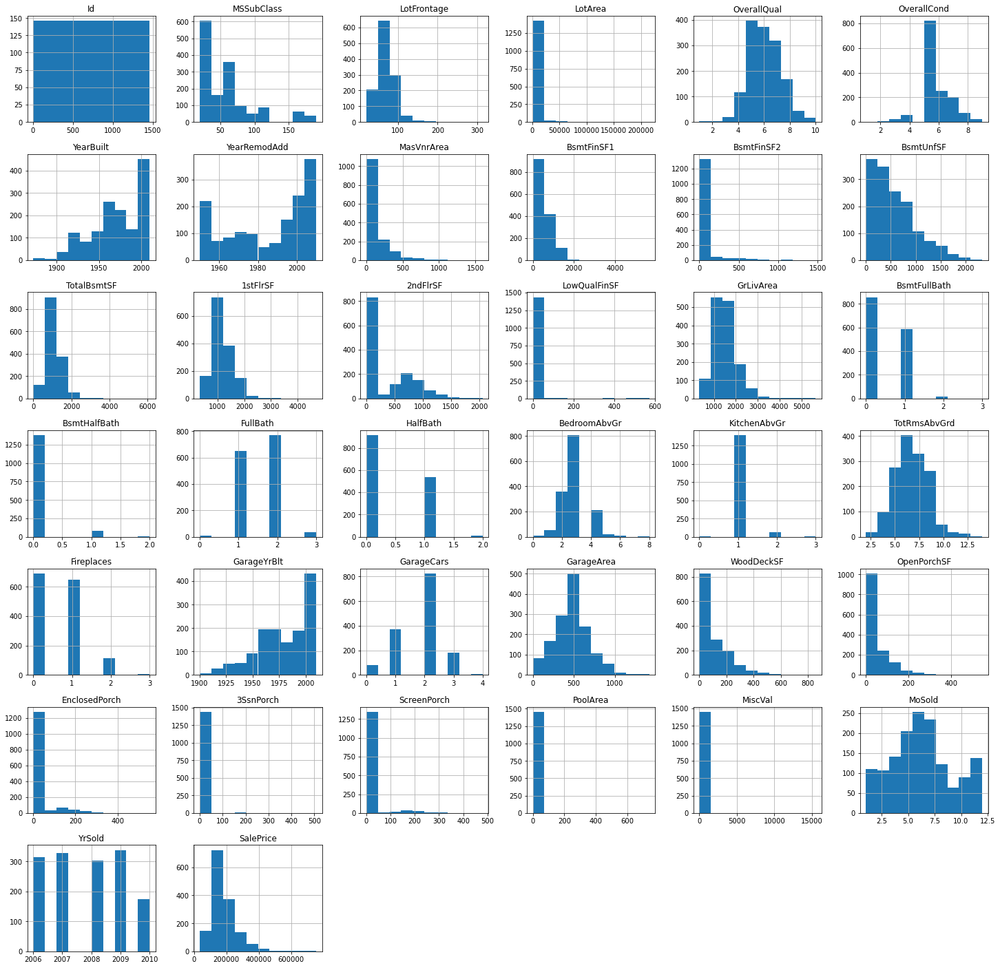

In [13]:
Train.hist(figsize=(25,25))

# Heat Map

<AxesSubplot:>

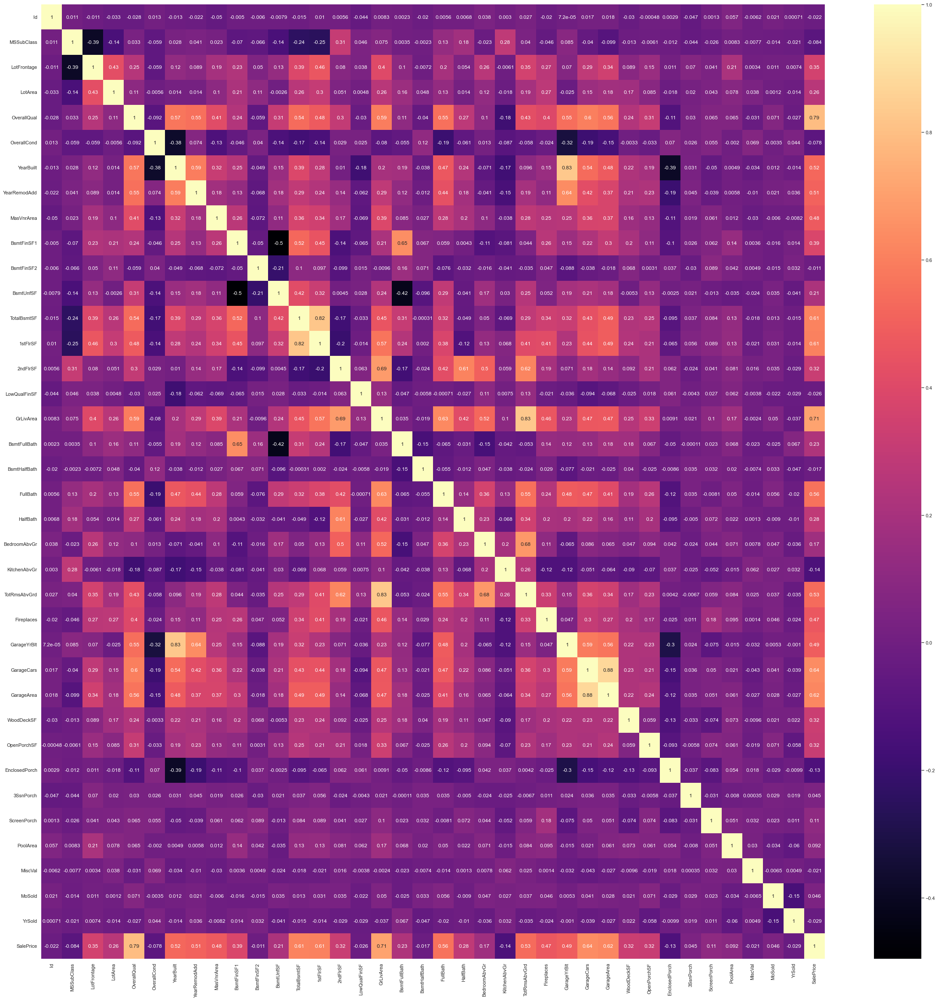

In [14]:
import seaborn as sb
sb.set(rc = {'figure.figsize':(40,40)})
sb.heatmap(Train.corr(), annot = True, cmap = 'magma')

# Missing values

<BarContainer object of 81 artists>

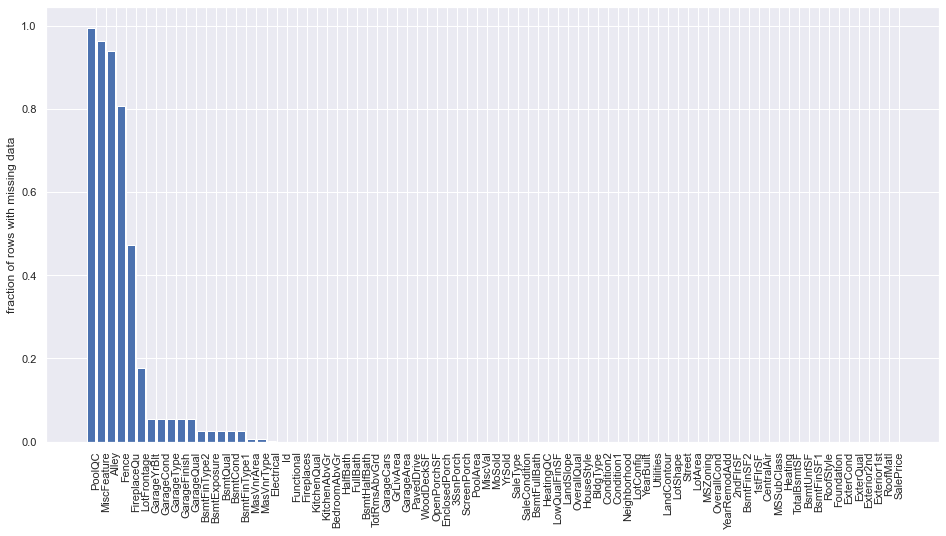

In [15]:
import numpy as np
import matplotlib.pyplot as plt
null_counts = Train.isna().sum().sort_values(ascending=False)/len(Train)
plt.figure(figsize=(16,8))
plt.xticks(np.arange(len(null_counts))+0.5,null_counts.index,rotation='vertical')
plt.ylabel('fraction of rows with missing data')
plt.bar(np.arange(len(null_counts)),null_counts)

In [16]:
s=Train.isna().sum().sort_values(ascending=False)

In [17]:
pd.set_option("display.max_rows", None, "display.max_columns", None)
print(s)

PoolQC           1453
MiscFeature      1406
Alley            1369
Fence            1179
FireplaceQu       690
LotFrontage       259
GarageYrBlt        81
GarageCond         81
GarageType         81
GarageFinish       81
GarageQual         81
BsmtFinType2       38
BsmtExposure       38
BsmtQual           37
BsmtCond           37
BsmtFinType1       37
MasVnrArea          8
MasVnrType          8
Electrical          1
Id                  0
Functional          0
Fireplaces          0
KitchenQual         0
KitchenAbvGr        0
BedroomAbvGr        0
HalfBath            0
FullBath            0
BsmtHalfBath        0
TotRmsAbvGrd        0
GarageCars          0
GrLivArea           0
GarageArea          0
PavedDrive          0
WoodDeckSF          0
OpenPorchSF         0
EnclosedPorch       0
3SsnPorch           0
ScreenPorch         0
PoolArea            0
MiscVal             0
MoSold              0
YrSold              0
SaleType            0
SaleCondition       0
BsmtFullBath        0
HeatingQC 

In [18]:
Train.drop(['PoolQC','MiscFeature','Alley','Fence'],axis=1,inplace=True)

In [19]:
Train.drop(['FireplaceQu'],axis=1,inplace=True)

# Handling missing values in continuous variables

In [20]:
Train['LotFrontage'].fillna(Train['LotFrontage'].median(), inplace=True)
Train['GarageYrBlt'].fillna(Train['GarageYrBlt'].median(), inplace=True)
Train['MasVnrArea'].fillna(Train['MasVnrArea'].median(), inplace=True)

# Handling missing values in categorical variables

In [21]:
Train['GarageCond']=Train['GarageCond'].fillna(Train['GarageCond'].mode()[0])
Train['GarageType']=Train['GarageType'].fillna(Train['GarageType'].mode()[0])
Train['GarageFinish']=Train['GarageFinish'].fillna(Train['GarageFinish'].mode()[0])
Train['GarageQual']=Train['GarageQual'].fillna(Train['GarageQual'].mode()[0])
Train['BsmtFinType2']=Train['BsmtFinType2'].fillna(Train['BsmtFinType2'].mode()[0])
Train['BsmtExposure']=Train['BsmtExposure'].fillna(Train['BsmtExposure'].mode()[0])
Train['BsmtQual']=Train['BsmtQual'].fillna(Train['BsmtQual'].mode()[0])
Train['BsmtCond']=Train['BsmtCond'].fillna(Train['BsmtCond'].mode()[0])
Train['BsmtFinType1']=Train['BsmtFinType1'].fillna(Train['BsmtFinType1'].mode()[0])
Train['MasVnrType']=Train['MasVnrType'].fillna(Train['MasVnrType'].mode()[0])



In [22]:
Train['Electrical']=Train['Electrical'].fillna(Train['Electrical'].mode()[0])



In [23]:
Train.isna().sum().sort_values(ascending=False)

Id               0
FullBath         0
Fireplaces       0
Functional       0
TotRmsAbvGrd     0
KitchenQual      0
KitchenAbvGr     0
BedroomAbvGr     0
HalfBath         0
BsmtHalfBath     0
MSSubClass       0
BsmtFullBath     0
GrLivArea        0
LowQualFinSF     0
2ndFlrSF         0
1stFlrSF         0
Electrical       0
CentralAir       0
GarageType       0
GarageYrBlt      0
GarageFinish     0
GarageCars       0
SaleCondition    0
SaleType         0
YrSold           0
MoSold           0
MiscVal          0
PoolArea         0
ScreenPorch      0
3SsnPorch        0
EnclosedPorch    0
OpenPorchSF      0
WoodDeckSF       0
PavedDrive       0
GarageCond       0
GarageQual       0
GarageArea       0
HeatingQC        0
Heating          0
TotalBsmtSF      0
YearBuilt        0
OverallQual      0
HouseStyle       0
BldgType         0
Condition2       0
Condition1       0
Neighborhood     0
LandSlope        0
LotConfig        0
Utilities        0
LandContour      0
LotShape         0
Street      

# Handling outliers in continuous variables

In [24]:
import numpy as np
Q1 = Train.quantile(0.25)
Q3 = Train.quantile(0.75)
# IQR = Q3 - Q1
print(Q1)
print(Q3)
df_copy = Train.copy()
for col in df_copy.select_dtypes(include=np.number):
        percentiles = df_copy[col].quantile([0.25, 0.75]).values
        if col!='Id':
            df_copy[col] = np.clip(df_copy[col], percentiles[0], percentiles[1])
df_copy

Id                  365.75
MSSubClass           20.00
LotFrontage          60.00
LotArea            7553.50
OverallQual           5.00
OverallCond           5.00
YearBuilt          1954.00
YearRemodAdd       1967.00
MasVnrArea            0.00
BsmtFinSF1            0.00
BsmtFinSF2            0.00
BsmtUnfSF           223.00
TotalBsmtSF         795.75
1stFlrSF            882.00
2ndFlrSF              0.00
LowQualFinSF          0.00
GrLivArea          1129.50
BsmtFullBath          0.00
BsmtHalfBath          0.00
FullBath              1.00
HalfBath              0.00
BedroomAbvGr          2.00
KitchenAbvGr          1.00
TotRmsAbvGrd          5.00
Fireplaces            0.00
GarageYrBlt        1962.00
GarageCars            1.00
GarageArea          334.50
WoodDeckSF            0.00
OpenPorchSF           0.00
EnclosedPorch         0.00
3SsnPorch             0.00
ScreenPorch           0.00
PoolArea              0.00
MiscVal               0.00
MoSold                5.00
YrSold             2007.00
S

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60.0,RL,65.0,8450.0,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7.0,5.0,2000.0,2003.0,Gable,CompShg,VinylSd,VinylSd,BrkFace,164.25,Gd,TA,PConc,Gd,TA,No,GLQ,706.00,Unf,0.0,223.0,856.00,GasA,Ex,Y,SBrkr,882.00,728.0,0.0,1710.00,1.0,0.0,2.0,1.0,3.0,1.0,Gd,7.0,Typ,0.0,Attchd,2001.0,RFn,2.0,548.0,TA,TA,Y,0.0,61.0,0.0,0.0,0.0,0.0,0.0,5.0,2008.0,WD,Normal,208500.0
1,2,20.0,RL,79.0,9600.0,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6.0,6.0,1976.0,1976.0,Gable,CompShg,MetalSd,MetalSd,None,0.00,TA,TA,CBlock,Gd,TA,Gd,ALQ,712.25,Unf,0.0,284.0,1262.00,GasA,Ex,Y,SBrkr,1262.00,0.0,0.0,1262.00,0.0,0.0,2.0,0.0,3.0,1.0,TA,6.0,Typ,1.0,Attchd,1976.0,RFn,2.0,460.0,TA,TA,Y,168.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,2007.0,WD,Normal,181500.0
2,3,60.0,RL,68.0,11250.0,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7.0,5.0,2000.0,2002.0,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.00,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.00,Unf,0.0,434.0,920.00,GasA,Ex,Y,SBrkr,920.00,728.0,0.0,1776.75,1.0,0.0,2.0,1.0,3.0,1.0,Gd,6.0,Typ,1.0,Attchd,2001.0,RFn,2.0,576.0,TA,TA,Y,0.0,42.0,0.0,0.0,0.0,0.0,0.0,8.0,2008.0,WD,Normal,214000.0
3,4,70.0,RL,60.0,9550.0,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7.0,5.0,1954.0,1970.0,Gable,CompShg,Wd Sdng,Wd Shng,None,0.00,TA,TA,BrkTil,TA,Gd,No,ALQ,216.00,Unf,0.0,540.0,795.75,GasA,Gd,Y,SBrkr,961.00,728.0,0.0,1717.00,1.0,0.0,1.0,0.0,3.0,1.0,Gd,7.0,Typ,1.0,Detchd,1998.0,Unf,2.0,576.0,TA,TA,Y,0.0,35.0,0.0,0.0,0.0,0.0,0.0,5.0,2007.0,WD,Abnorml,140000.0
4,5,60.0,RL,79.0,11601.5,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7.0,5.0,2000.0,2000.0,Gable,CompShg,VinylSd,VinylSd,BrkFace,164.25,Gd,TA,PConc,Gd,TA,Av,GLQ,655.00,Unf,0.0,490.0,1145.00,GasA,Ex,Y,SBrkr,1145.00,728.0,0.0,1776.75,1.0,0.0,2.0,1.0,3.0,1.0,Gd,7.0,Typ,1.0,Attchd,2000.0,RFn,2.0,576.0,TA,TA,Y,168.0,68.0,0.0,0.0,0.0,0.0,0.0,8.0,2008.0,WD,Normal,214000.0
5,6,50.0,RL,79.0,11601.5,Pave,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5.0,5.0,1993.0,1995.0,Gable,CompShg,VinylSd,VinylSd,None,0.00,TA,TA,Wood,Gd,TA,No,GLQ,712.25,Unf,0.0,223.0,796.00,GasA,Ex,Y,SBrkr,882.00,566.0,0.0,1362.00,1.0,0.0,1.0,1.0,2.0,1.0,TA,5.0,Typ,0.0,Attchd,1993.0,Unf,2.0,480.0,TA,TA,Y,40.0,30.0,0.0,0.0,0.0,0.0,0.0,8.0,2009.0,WD,Normal,143000.0
6,7,20.0,RL,75.0,10084.0,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,7.0,5.0,2000.0,2004.0,Gable,CompShg,VinylSd,VinylSd,Stone,164.25,Gd,TA,PConc,Ex,TA,Av,GLQ,712.25,Unf,0.0,317.0,1298.25,GasA,Ex,Y,SBrkr,1391.25,0.0,0.0,1694.00,1.0,0.0,2.0,0.0,3.0,1.0,Gd,7.0,Typ,1.0,Attchd,2001.0,RFn,2.0,576.0,TA,TA,Y,168.0,57.0,0.0,0.0,0.0,0.0,0.0,8.0,2007.0,WD,Normal,214000.0
7,8,60.0,RL,69.0,10382.0,Pave,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7.0,6.0,1973.0,1973.0,Gable,CompShg,HdBoard,HdBoard,Stone,164.25,TA,TA,CBlock,Gd,TA,Mn,ALQ,712.25,BLQ,0.0,223.0,1107.00,GasA,Ex,Y,SBrkr,1107.00,728.0,0.0,1776.75,1.0,0.0,2.0,1.0,3.0,1.0,TA,7.0,Typ,1.0,Attchd,1973.0,RFn,2.0,484.0,TA,TA,Y,168.0,68.0,0.0,0.0,0.0,0.0,0.0,8.0,2009.0,WD,Normal,200000.0
8,9,50.0,RM,60.0,7553.5,Pave,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7.0,5.0,1954.0,1967.0,Gable,CompShg,BrkFace,Wd Shng,None,0.00,TA,

In [25]:
df_copy

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60.0,RL,65.0,8450.0,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7.0,5.0,2000.0,2003.0,Gable,CompShg,VinylSd,VinylSd,BrkFace,164.25,Gd,TA,PConc,Gd,TA,No,GLQ,706.00,Unf,0.0,223.0,856.00,GasA,Ex,Y,SBrkr,882.00,728.0,0.0,1710.00,1.0,0.0,2.0,1.0,3.0,1.0,Gd,7.0,Typ,0.0,Attchd,2001.0,RFn,2.0,548.0,TA,TA,Y,0.0,61.0,0.0,0.0,0.0,0.0,0.0,5.0,2008.0,WD,Normal,208500.0
1,2,20.0,RL,79.0,9600.0,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6.0,6.0,1976.0,1976.0,Gable,CompShg,MetalSd,MetalSd,None,0.00,TA,TA,CBlock,Gd,TA,Gd,ALQ,712.25,Unf,0.0,284.0,1262.00,GasA,Ex,Y,SBrkr,1262.00,0.0,0.0,1262.00,0.0,0.0,2.0,0.0,3.0,1.0,TA,6.0,Typ,1.0,Attchd,1976.0,RFn,2.0,460.0,TA,TA,Y,168.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,2007.0,WD,Normal,181500.0
2,3,60.0,RL,68.0,11250.0,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7.0,5.0,2000.0,2002.0,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.00,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.00,Unf,0.0,434.0,920.00,GasA,Ex,Y,SBrkr,920.00,728.0,0.0,1776.75,1.0,0.0,2.0,1.0,3.0,1.0,Gd,6.0,Typ,1.0,Attchd,2001.0,RFn,2.0,576.0,TA,TA,Y,0.0,42.0,0.0,0.0,0.0,0.0,0.0,8.0,2008.0,WD,Normal,214000.0
3,4,70.0,RL,60.0,9550.0,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7.0,5.0,1954.0,1970.0,Gable,CompShg,Wd Sdng,Wd Shng,None,0.00,TA,TA,BrkTil,TA,Gd,No,ALQ,216.00,Unf,0.0,540.0,795.75,GasA,Gd,Y,SBrkr,961.00,728.0,0.0,1717.00,1.0,0.0,1.0,0.0,3.0,1.0,Gd,7.0,Typ,1.0,Detchd,1998.0,Unf,2.0,576.0,TA,TA,Y,0.0,35.0,0.0,0.0,0.0,0.0,0.0,5.0,2007.0,WD,Abnorml,140000.0
4,5,60.0,RL,79.0,11601.5,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7.0,5.0,2000.0,2000.0,Gable,CompShg,VinylSd,VinylSd,BrkFace,164.25,Gd,TA,PConc,Gd,TA,Av,GLQ,655.00,Unf,0.0,490.0,1145.00,GasA,Ex,Y,SBrkr,1145.00,728.0,0.0,1776.75,1.0,0.0,2.0,1.0,3.0,1.0,Gd,7.0,Typ,1.0,Attchd,2000.0,RFn,2.0,576.0,TA,TA,Y,168.0,68.0,0.0,0.0,0.0,0.0,0.0,8.0,2008.0,WD,Normal,214000.0
5,6,50.0,RL,79.0,11601.5,Pave,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5.0,5.0,1993.0,1995.0,Gable,CompShg,VinylSd,VinylSd,None,0.00,TA,TA,Wood,Gd,TA,No,GLQ,712.25,Unf,0.0,223.0,796.00,GasA,Ex,Y,SBrkr,882.00,566.0,0.0,1362.00,1.0,0.0,1.0,1.0,2.0,1.0,TA,5.0,Typ,0.0,Attchd,1993.0,Unf,2.0,480.0,TA,TA,Y,40.0,30.0,0.0,0.0,0.0,0.0,0.0,8.0,2009.0,WD,Normal,143000.0
6,7,20.0,RL,75.0,10084.0,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,7.0,5.0,2000.0,2004.0,Gable,CompShg,VinylSd,VinylSd,Stone,164.25,Gd,TA,PConc,Ex,TA,Av,GLQ,712.25,Unf,0.0,317.0,1298.25,GasA,Ex,Y,SBrkr,1391.25,0.0,0.0,1694.00,1.0,0.0,2.0,0.0,3.0,1.0,Gd,7.0,Typ,1.0,Attchd,2001.0,RFn,2.0,576.0,TA,TA,Y,168.0,57.0,0.0,0.0,0.0,0.0,0.0,8.0,2007.0,WD,Normal,214000.0
7,8,60.0,RL,69.0,10382.0,Pave,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7.0,6.0,1973.0,1973.0,Gable,CompShg,HdBoard,HdBoard,Stone,164.25,TA,TA,CBlock,Gd,TA,Mn,ALQ,712.25,BLQ,0.0,223.0,1107.00,GasA,Ex,Y,SBrkr,1107.00,728.0,0.0,1776.75,1.0,0.0,2.0,1.0,3.0,1.0,TA,7.0,Typ,1.0,Attchd,1973.0,RFn,2.0,484.0,TA,TA,Y,168.0,68.0,0.0,0.0,0.0,0.0,0.0,8.0,2009.0,WD,Normal,200000.0
8,9,50.0,RM,60.0,7553.5,Pave,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7.0,5.0,1954.0,1967.0,Gable,CompShg,BrkFace,Wd Shng,None,0.00,TA,

In [26]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)


# Normalisation

In [27]:
from sklearn import preprocessing
df_minmax = Train._get_numeric_data()
df_minmax
updated_df = df_minmax.loc[:, df_minmax.columns != 'Id']
min_max_scaler = preprocessing.MinMaxScaler()

a_scaled = min_max_scaler.fit_transform(updated_df) 
df_scaled = pd.DataFrame(data=a_scaled, columns=updated_df.columns)
df_scaled.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,0.235294,0.150685,0.033420,0.666667,0.500,0.949275,0.883333,0.12250,0.125089,0.0,0.064212,0.140098,0.119780,0.413559,0.0,0.259231,0.333333,0.0,0.666667,0.5,0.375,0.333333,0.500000,0.000000,0.936364,0.50,0.386460,0.000000,0.111517,0.000000,0.0,0.0,0.0,0.0,0.090909,0.50,0.241078
1,0.000000,0.202055,0.038795,0.555556,0.875,0.753623,0.433333,0.00000,0.173281,0.0,0.121575,0.206547,0.212942,0.000000,0.0,0.174830,0.000000,0.5,0.666667,0.0,0.375,0.333333,0.333333,0.333333,0.690909,0.50,0.324401,0.347725,0.000000,0.000000,0.0,0.0,0.0,0.0,0.363636,0.25,0.203583
2,0.235294,0.160959,0.046507,0.666667,0.500,0.934783,0.866667,0.10125,0.086109,0.0,0.185788,0.150573,0.134465,0.419370,0.0,0.273549,0.333333,0.0,0.666667,0.5,0.375,0.333333,0.333333,0.333333,0.918182,0.50,0.428773,0.000000,0.076782,0.000000,0.0,0.0,0.0,0.0,0.727273,0.50,0.261908
3,0.294118,0.133562,0.038561,0.666667,0.500,0.311594,0.333333,0.00000,0.038271,0.0,0.231164,0.123732,0.143873,0.366102,0.0,0.260550,0.333333,0.0,0.333333,0.0,0.375,0.333333,0.416667,0.333333,0.890909,0.75,0.452750,0.000000,0.063985,0.492754,0.0,0.0,0.0,0.0,0.090909,0.00,0.145952
4,0.235294,0.215753,0.060576,0.777778,0.500,0.927536,0.833333,0.21875,0.116052,0.0,0.209760,0.187398,0.186095,0.509927,0.0,0.351168,0.333333,0.0,0.666667,0.5,0.500,0.333333,0.583333,0.333333,0.909091,0.75,0.589563,0.224037,0.153565,0.000000,0.0,0.0,0.0,0.0,1.000000,0.50,0.298709


# Transformation

In [28]:
data_column_category = df_copy.select_dtypes(exclude=[np.number]).columns
data_column_category

Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond',
       'PavedDrive', 'SaleType', 'SaleCondition'],
      dtype='object')

In [29]:
data_column_category.shape

(38,)

In [30]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
for i in data_column_category:
    df_copy[i] = label_encoder.fit_transform(df_copy[i])
print("Label Encoded Data: ")
df_copy.head()

Label Encoded Data: 


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60.0,3,65.0,8450.0,1,3,3,0,4,0,5,2,2,0,5,7.0,5.0,2000.0,2003.0,1,1,12,13,1,164.25,2,4,2,2,3,3,2,706.00,5,0.0,223.0,856.00,1,0,1,4,882.0,728.0,0.0,1710.00,1.0,0.0,2.0,1.0,3.0,1.0,2,7.0,6,0.0,1,2001.0,1,2.0,548.0,4,4,2,0.0,61.0,0.0,0.0,0.0,0.0,0.0,5.0,2008.0,8,4,208500.0
1,2,20.0,3,79.0,9600.0,1,3,3,0,2,0,24,1,2,0,2,6.0,6.0,1976.0,1976.0,1,1,8,8,2,0.00,3,4,1,2,3,1,0,712.25,5,0.0,284.0,1262.00,1,0,1,4,1262.0,0.0,0.0,1262.00,0.0,0.0,2.0,0.0,3.0,1.0,3,6.0,6,1.0,1,1976.0,1,2.0,460.0,4,4,2,168.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,2007.0,8,4,181500.0
2,3,60.0,3,68.0,11250.0,1,0,3,0,4,0,5,2,2,0,5,7.0,5.0,2000.0,2002.0,1,1,12,13,1,162.00,2,4,2,2,3,2,2,486.00,5,0.0,434.0,920.00,1,0,1,4,920.0,728.0,0.0,1776.75,1.0,0.0,2.0,1.0,3.0,1.0,2,6.0,6,1.0,1,2001.0,1,2.0,576.0,4,4,2,0.0,42.0,0.0,0.0,0.0,0.0,0.0,8.0,2008.0,8,4,214000.0
3,4,70.0,3,60.0,9550.0,1,0,3,0,0,0,6,2,2,0,5,7.0,5.0,1954.0,1970.0,1,1,13,15,2,0.00,3,4,0,3,1,3,0,216.00,5,0.0,540.0,795.75,1,2,1,4,961.0,728.0,0.0,1717.00,1.0,0.0,1.0,0.0,3.0,1.0,2,7.0,6,1.0,5,1998.0,2,2.0,576.0,4,4,2,0.0,35.0,0.0,0.0,0.0,0.0,0.0,5.0,2007.0,8,0,140000.0
4,5,60.0,3,79.0,11601.5,1,0,3,0,2,0,15,2,2,0,5,7.0,5.0,2000.0,2000.0,1,1,12,13,1,164.25,2,4,2,2,3,0,2,655.00,5,0.0,490.0,1145.00,1,0,1,4,1145.0,728.0,0.0,1776.75,1.0,0.0,2.0,1.0,3.0,1.0,2,7.0,6,1.0,1,2000.0,1,2.0,576.0,4,4,2,168.0,68.0,0.0,0.0,0.0,0.0,0.0,8.0,2008.0,8,4,214000.0


In [31]:
df_copy.shape

(1460, 76)

In [32]:
X=df_copy.drop(['SalePrice'],axis=1) # selecting features
y=df_copy['SalePrice'] # target feature

# Splitting data into train and test samples

In [33]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

# Linear regression

In [34]:
from sklearn import linear_model
reg = linear_model.LinearRegression()

In [35]:
reg.fit(X_train,y_train)

LinearRegression()

In [36]:
y_pred=reg.predict(X_test)

In [37]:
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.metrics import mean_absolute_error
print("MAE",mean_absolute_error(y_test,y_pred))
print("R2 Score for our training data: " + str(r2_score(y_test,y_pred)))
print("RMSE for our training data: " + str(np.sqrt(mean_squared_error(y_test,y_pred))))

MAE 9916.548084161399
R2 Score for our training data: 0.8546360416232364
RMSE for our training data: 13034.094569789046


# Random forest

In [38]:
from sklearn.ensemble import RandomForestRegressor
# Instantiate model with 1000 decision trees
rf = RandomForestRegressor(n_estimators = 1000, random_state = 42)
# Train the model on training data
rf.fit(X_train,y_train);
y_pred=rf.predict(X_test)

In [39]:
print("R2 Score for our training data: " + str(r2_score(y_test,y_pred)))
print("RMSE for our training data: " + str(np.sqrt(mean_squared_error(y_test,y_pred))))
print(mean_absolute_error(y_test,y_pred))

R2 Score for our training data: 0.8747531714141427
RMSE for our training data: 12098.620833018613
8011.100290456431


# Elastic net model

In [40]:
from sklearn.linear_model import ElasticNet
en = ElasticNet(alpha = 0.01)
en.fit(X_train, y_train)
y_pred = en.predict(X_test)

In [41]:
print("R2 Score for our training data: " + str(r2_score(y_test,y_pred)))
print("RMSE for our training data: " + str(np.sqrt(mean_squared_error(y_test,y_pred))))
print(mean_absolute_error(y_test,y_pred))

R2 Score for our training data: 0.8551087277618834
RMSE for our training data: 13012.8855555778
9915.132029880313


# Gradient Boosting

In [42]:
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score
from sklearn.metrics import confusion_matrix
scaler = StandardScaler().fit(X_train)
rescaled_X_train = scaler.transform(X_train)
model = GradientBoostingRegressor(random_state=21, n_estimators=400)
model.fit(rescaled_X_train, y_train)
rescaled_X_test = scaler.transform(X_test)
predictions = model.predict(rescaled_X_test)
print("MAE",mean_absolute_error(y_test,y_pred))
print("R2 Score for our training data: " + str(r2_score(y_test,y_pred)))
print("RMSE for our training data: " + str(np.sqrt(mean_squared_error(y_test,y_pred))))

MAE 9915.132029880313
R2 Score for our training data: 0.8551087277618834
RMSE for our training data: 13012.8855555778


# Naive Bayes

In [43]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score
from sklearn.metrics import confusion_matrix
#Training the model using Naive Bayes algorithm
nb = GaussianNB()
nb.fit(X_train,y_train)
y_pred = nb.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy")
print(accuracy)
print("MAE",mean_absolute_error(y_test,y_pred))
print("R2 Score for our training data: " + str(r2_score(y_test,y_pred)))
print("RMSE for our training data: " + str(np.sqrt(mean_squared_error(y_test,y_pred))))
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
cm_df = pd.DataFrame(cm)
cm_df

Accuracy
0.16182572614107885
MAE 17778.63692946058
R2 Score for our training data: 0.49028804413522054
RMSE for our training data: 24407.028467047894


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150
0,32,1,0,0,0,0,0,2,2,0,0,0,0,0,0,0,16,0,0,0,0,0,0,0,0,8,0,6,1,6,0,4,0,6,0,4,0,5,8,0,0,0,0,1,0,0,0,0,3,0,0,0,0,0,1,0,0,0,1,0,0,0,0,4,0,1,0,0,0,2,0,0,0,0,0,0,3,0,0,1,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


# KNN 

MAE: 13438.01
R2 Score for our training data: 0.7008317518488483
RMSE: 18698.65


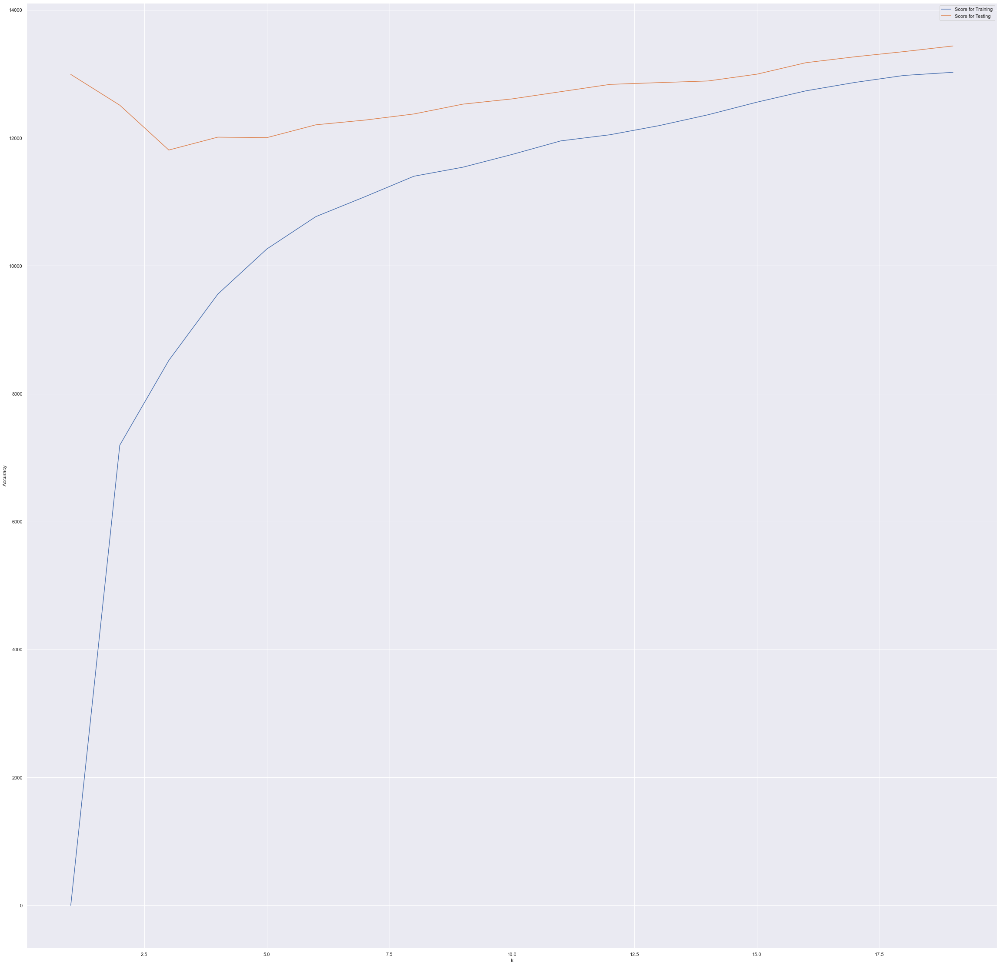

In [44]:
from sklearn.neighbors import KNeighborsRegressor
from matplotlib.pyplot import figure
resultsKNN = pd.DataFrame(columns=['KNN', 'Score for Training', 'Score for Testing'])

for knnCount in range (1,20):
    knn = KNeighborsRegressor(n_neighbors=knnCount, p=1, metric='minkowski') #manhattan dist here
    knn.fit(X_train, y_train)
    y_train_pred = knn.predict(X_train)
    y_pred = knn.predict(X_test)
    
    scoreTrain = mean_absolute_error(y_train, y_train_pred)
    scoreTest = mean_absolute_error(y_test, y_pred)

    resultsKNN.loc[knnCount] = [knnCount, scoreTrain, scoreTest]
    
resultsKNN.pop('KNN')
ax = resultsKNN.plot()
ax.set(xlabel='$k$', ylabel='Mean Absolute Error')
ax.set(xlabel='k', ylabel='Accuracy')
print("MAE: {:.2f}".format( mean_absolute_error(y_test, y_pred) ) )
print("R2 Score for our training data: " + str(r2_score(y_test,y_pred)))
print("RMSE: {:.2f}".format( np.sqrt( mean_squared_error(y_test, y_pred) ) ) )